In [ ]:
import os
file_path = 'mobilenet_V2_model/models/best_model_fold_4.keras'
if os.path.exists(file_path):
    print(f"The file {file_path} exists.")
else:
    print(f"The file {file_path} does not exist.")

The file mobilenet_V2_model/models/best_model_fold_4.keras exists.


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import Callback, ModelCheckpoint
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score
import numpy as np
import os
import matplotlib.pyplot as plt
import logging
import datetime

log_dir = 'logs'
os.makedirs(log_dir, exist_ok=True)
logging.basicConfig(
    filename=os.path.join(log_dir, f'training_{datetime.datetime.now().strftime("%Y%m%d_%H%M%S")}.log'),
    level=logging.INFO,
    format='%(asctime)s:%(levelname)s:%(message)s'
)

base_dir_aug = 'dataset/Augmented Images/Augmented Images/FOLDS_AUG'
base_dir_orig = 'dataset/Original Images/Original Images/FOLDS'

folds = [1, 2, 3, 4, 5]

num_classes = 6
input_shape = (224, 224, 3)
batch_size = 32
epochs = 20 

model_dir = 'mobilenet_V2_model/models'
plot_dir = 'mobilenet_V2_model/plots'
os.makedirs(model_dir, exist_ok=True)
os.makedirs(plot_dir, exist_ok=True)

best_overall_score = 0
best_overall_model_path = os.path.join(model_dir, 'best_overall_model.h5')

history_dict = {}

class MetricsCallback(Callback):
    def __init__(self, validation_generator, fold):
        self.validation_generator = validation_generator
        self.fold = fold
        self.metrics = {'precision': [], 'recall': [], 'f1': [], 'accuracy': [], 'specificity': []}

    def on_epoch_end(self, epoch, logs=None):
        val_pred = self.model.predict(self.validation_generator)
        val_pred_classes = np.argmax(val_pred, axis=1)
        val_true_classes = self.validation_generator.classes

        conf_mat = confusion_matrix(val_true_classes, val_pred_classes)
        precision = precision_score(val_true_classes, val_pred_classes, average='macro', zero_division=0)
        recall = recall_score(val_true_classes, val_pred_classes, average='macro', zero_division=0)
        f1 = f1_score(val_true_classes, val_pred_classes, average='macro', zero_division=0)
        accuracy = accuracy_score(val_true_classes, val_pred_classes)

        specificity = []
        for i in range(num_classes):
            tn = conf_mat.sum() - (conf_mat[i, :].sum() + conf_mat[:, i].sum() - conf_mat[i, i])
            fp = conf_mat[:, i].sum() - conf_mat[i, i]
            specificity_i = tn / (tn + fp) if (tn + fp) > 0 else 0
            specificity.append(specificity_i)
        specificity = np.mean(specificity)

        logging.info(f'Fold {self.fold} Epoch {epoch + 1} Validation Metrics:')
        logging.info(f'Confusion Matrix:\n{conf_mat}')
        logging.info(f'Precision: {precision:.4f}')
        logging.info(f'Recall (Sensitivity): {recall:.4f}')
        logging.info(f'Specificity: {specificity:.4f}')
        logging.info(f'F1-Score: {f1:.4f}')
        logging.info(f'Accuracy: {accuracy:.4f}')

        self.metrics['precision'].append(precision)
        self.metrics['recall'].append(recall)
        self.metrics['f1'].append(f1)
        self.metrics['accuracy'].append(accuracy)
        self.metrics['specificity'].append(specificity)

def plot_metrics(history, fold):
    epochs_range = range(1, epochs + 1)
    plt.figure(figsize=(14, 10))

    plt.subplot(3, 2, 1)
    plt.plot(epochs_range, history['precision'], label='Precision')
    plt.title(f'Fold {fold} Precision over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Precision')
    plt.legend()

    plt.subplot(3, 2, 2)
    plt.plot(epochs_range, history['recall'], label='Recall', color='orange')
    plt.title(f'Fold {fold} Recall over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Recall')
    plt.legend()

    plt.subplot(3, 2, 3)
    plt.plot(epochs_range, history['f1'], label='F1-Score', color='green')
    plt.title(f'Fold {fold} F1-Score over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('F1-Score')
    plt.legend()

    plt.subplot(3, 2, 4)
    plt.plot(epochs_range, history['accuracy'], label='Accuracy', color='red')
    plt.title(f'Fold {fold} Accuracy over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(3, 2, 5)
    plt.plot(epochs_range, history['specificity'], label='Specificity', color='purple')
    plt.title(f'Fold {fold} Specificity over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Specificity')
    plt.legend()

    plt.tight_layout()
    plt.savefig(os.path.join(plot_dir, f'fold_{fold}_metrics.png'))
    plt.close()

for fold in folds:
    logging.info(f'\nTraining on Fold {fold}...')

    train_dir = os.path.join(base_dir_aug, f'fold{fold}_AUG', 'Train')
    valid_dir = os.path.join(base_dir_orig, f'fold{fold}', 'Valid')
    test_dir = os.path.join(base_dir_orig, f'fold{fold}', 'Test')

    train_datagen = ImageDataGenerator(rescale=1.0 / 255)
    valid_datagen = ImageDataGenerator(rescale=1.0 / 255)
    test_datagen = ImageDataGenerator(rescale=1.0 / 255)

    train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=input_shape[:2],
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=True,
    )

    valid_generator = valid_datagen.flow_from_directory(
        valid_dir,
        target_size=input_shape[:2],
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False,
    )

    test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=input_shape[:2],
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False,
    )

    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False  # Freeze base model layers if fine-tuning is not needed
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    predictions_layer = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions_layer)

    model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

    metrics_callback = MetricsCallback(valid_generator, fold)

    fold_model_path = os.path.join(model_dir, f'best_model_fold_{fold}.keras')
    checkpoint_callback = ModelCheckpoint(fold_model_path, monitor='val_accuracy', save_best_only=True, mode='max')

    history = model.fit(
        train_generator,
        epochs=epochs,
        validation_data=valid_generator,
        callbacks=[metrics_callback, checkpoint_callback],
    )

    history_dict[fold] = metrics_callback.metrics

    plot_metrics(metrics_callback.metrics, fold)

    model.load_weights(fold_model_path)

    test_steps = test_generator.samples // test_generator.batch_size
    if test_generator.samples % test_generator.batch_size != 0:
        test_steps += 1
    test_pred = model.predict(test_generator, steps=test_steps)
    test_pred_classes = np.argmax(test_pred, axis=1)
    test_true_classes = test_generator.classes

    conf_mat = confusion_matrix(test_true_classes, test_pred_classes)
    precision = precision_score(test_true_classes, test_pred_classes, average='macro', zero_division=0)
    recall = recall_score(test_true_classes, test_pred_classes, average='macro', zero_division=0)
    f1 = f1_score(test_true_classes, test_pred_classes, average='macro', zero_division=0)
    accuracy = accuracy_score(test_true_classes, test_pred_classes)

    specificity = []
    for i in range(num_classes):
        tn = conf_mat.sum() - (conf_mat[i, :].sum() + conf_mat[:, i].sum() - conf_mat[i, i])
        fp = conf_mat[:, i].sum() - conf_mat[i, i]
        specificity_i = tn / (tn + fp) if (tn + fp) > 0 else 0
        specificity.append(specificity_i)
    specificity = np.mean(specificity)

    logging.info(f'\nFold {fold} Test Metrics:')
    logging.info(f'Confusion Matrix:\n{conf_mat}')
    logging.info(f'Precision: {precision:.4f}')
    logging.info(f'Recall (Sensitivity): {recall:.4f}')
    logging.info(f'Specificity: {specificity:.4f}')
    logging.info(f'F1-Score: {f1:.4f}')
    logging.info(f'Accuracy: {accuracy:.4f}')

    print(f'\nFold {fold} Test metrics:')
    print(f'Confusion Matrix:\n{conf_mat}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall (Sensitivity): {recall:.4f}')
    print(f'Specificity: {specificity:.4f}')
    print(f'F1-Score: {f1:.4f}')
    print(f'Accuracy: {accuracy:.4f}')

    combined_score = (precision + recall + f1 + accuracy) / 4

    logging.info(f'Combined Score for Fold {fold}: {combined_score:.4f}')

    if combined_score > best_overall_score:
        best_overall_score = combined_score
        model.save(best_overall_model_path)
        logging.info(f'Best overall model updated with Fold {fold} (Score: {combined_score:.4f})')

plt.figure(figsize=(14, 10))

avg_precision = [history_dict[fold]['precision'] for fold in folds]
mean_precision = np.mean(avg_precision, axis=0)
plt.subplot(3, 2, 1)
plt.plot(range(1, epochs + 1), mean_precision, label='Average Precision')
plt.title('Average Precision over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.legend()

avg_recall = [history_dict[fold]['recall'] for fold in folds]
mean_recall = np.mean(avg_recall, axis=0)
plt.subplot(3, 2, 2)
plt.plot(range(1, epochs + 1), mean_recall, label='Average Recall', color='orange')
plt.title('Average Recall over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.legend()

avg_f1 = [history_dict[fold]['f1'] for fold in folds]
mean_f1 = np.mean(avg_f1, axis=0)
plt.subplot(3, 2, 3)
plt.plot(range(1, epochs + 1), mean_f1, label='Average F1-Score', color='green')
plt.title('Average F1-Score over Epochs')
plt.xlabel('Epoch')
plt.ylabel('F1-Score')
plt.legend()

avg_accuracy = [history_dict[fold]['accuracy'] for fold in folds]
mean_accuracy = np.mean(avg_accuracy, axis=0)
plt.subplot(3, 2, 4)
plt.plot(range(1, epochs + 1), mean_accuracy, label='Average Accuracy', color='red')
plt.title('Average Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

avg_specificity = [history_dict[fold]['specificity'] for fold in folds]
mean_specificity = np.mean(avg_specificity, axis=0)
plt.subplot(3, 2, 5)
plt.plot(range(1, epochs + 1), mean_specificity, label='Average Specificity', color='purple')
plt.title('Average Specificity over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Specificity')
plt.legend()

plt.tight_layout()
plt.savefig(os.path.join(plot_dir, 'average_metrics_over_epochs.png'))
plt.close()

logging.info('Training complete. All metrics have been logged and plotted.')

Found 7518 images belonging to 6 classes.
Found 144 images belonging to 6 classes.
Found 74 images belonging to 6 classes.
Epoch 1/20


/home/ryanl/Documents/Mpox-Screen-Lite/.venv/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step   step - accuracy: 0.6342 - loss
235/235 ━━━━━━━━━━━━━━━━━━━━ 195s 809ms/step - accuracy: 0.6346 - loss: 1.0092 - val_accuracy: 0.7153 - val_loss: 0.7701
Epoch 2/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 653ms/stepstep - accuracy: 0.8570 - lo
235/235 ━━━━━━━━━━━━━━━━━━━━ 196s 834ms/step - accuracy: 0.8570 - loss: 0.4319 - val_accuracy: 0.7292 - val_loss: 0.7412
Epoch 3/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 653ms/stepstep - accuracy: 0.8899 - lo
235/235 ━━━━━━━━━━━━━━━━━━━━ 189s 806ms/step - accuracy: 0.8899 - loss: 0.3370 - val_accuracy: 0.6944 - val_loss: 0.8171
Epoch 4/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 679ms/stepstep - accuracy: 0.9074 - lo
235/235 ━━━━━━━━━━━━━━━━━━━━ 189s 804ms/step - accuracy: 0.9074 - loss: 0.2892 - val_accuracy: 0.7083 - val_loss: 0.7792
Epoch 5/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 640ms/stepstep - accuracy: 0.9174 - lo
235/235 ━━━━━━━━━━━━━━━━━━━━ 195s 829ms/step - accuracy: 0.9175 - loss: 0.2607 - val_accuracy: 0.7292 - val_loss: 0.7297
Epoch 6/20
5/5

/home/ryanl/Documents/Mpox-Screen-Lite/.venv/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 447ms/step



Fold 1 Test metrics:
Confusion Matrix:
[[ 6  0  0  0  0  3]
 [ 0  3  1  1  0  2]
 [ 0  0 14  0  0  2]
 [ 0  0  2  7  0  0]
 [ 0  0  2  0  3  1]
 [ 2  0  3  2  0 20]]
Precision: 0.8001
Recall (Sensitivity): 0.6648
Specificity: 0.9358
F1-Score: 0.6956
Accuracy: 0.7162
Found 7126 images belonging to 6 classes.
Found 164 images belonging to 6 classes.
Found 82 images belonging to 6 classes.
Epoch 1/20


/home/ryanl/Documents/Mpox-Screen-Lite/.venv/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 7s 947ms/stepstep - accuracy: 0.5658 - 
223/223 ━━━━━━━━━━━━━━━━━━━━ 190s 824ms/step - accuracy: 0.5664 - loss: 1.1461 - val_accuracy: 0.7622 - val_loss: 0.5864
Epoch 2/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 630ms/stepstep - accuracy: 0.8363 - 
223/223 ━━━━━━━━━━━━━━━━━━━━ 179s 803ms/step - accuracy: 0.8364 - loss: 0.4922 - val_accuracy: 0.7317 - val_loss: 0.6081
Epoch 3/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 614ms/stepstep - accuracy: 0.8734 - 
223/223 ━━━━━━━━━━━━━━━━━━━━ 179s 802ms/step - accuracy: 0.8734 - loss: 0.3873 - val_accuracy: 0.7134 - val_loss: 0.6063
Epoch 4/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 631ms/stepstep - accuracy: 0.8979 - 
223/223 ━━━━━━━━━━━━━━━━━━━━ 178s 800ms/step - accuracy: 0.8979 - loss: 0.3158 - val_accuracy: 0.7500 - val_loss: 0.5769
Epoch 5/20
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 646ms/stepstep - accuracy: 0.9121 - 
223/223 ━━━━━━━━━━━━━━━━━━━━ 180s 806ms/step - accuracy: 0.9121 - loss: 0.2835 - val_accuracy: 0.7927 - val_loss: 0.5631
Epoch 6/20
6/6 ━━━━━━━━━━━

/home/ryanl/Documents/Mpox-Screen-Lite/.venv/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 815ms/step

Fold 2 Test metrics:
Confusion Matrix:
[[ 4  0  0  0  0  7]
 [ 0  3  1  0  0  0]
 [ 0  0 19  1  0  0]
 [ 1  0  2  7  0  1]
 [ 0  0  0  1  2  2]
 [ 3  0  5  4  0 19]]
Precision: 0.7329
Recall (Sensitivity): 0.6188
Specificity: 0.9223
F1-Score: 0.6458
Accuracy: 0.6585
Found 7532 images belonging to 6 classes.
Found 153 images belonging to 6 classes.
Found 64 images belonging to 6 classes.
Epoch 1/20


/home/ryanl/Documents/Mpox-Screen-Lite/.venv/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step   step - accuracy: 0.6063 - loss
236/236 ━━━━━━━━━━━━━━━━━━━━ 200s 818ms/step - accuracy: 0.6068 - loss: 1.0681 - val_accuracy: 0.6340 - val_loss: 0.9815
Epoch 2/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 723ms/stepstep - accuracy: 0.8575 - lo
236/236 ━━━━━━━━━━━━━━━━━━━━ 188s 798ms/step - accuracy: 0.8574 - loss: 0.4302 - val_accuracy: 0.6536 - val_loss: 0.9199
Epoch 3/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 707ms/stepstep - accuracy: 0.8917 - lo
236/236 ━━━━━━━━━━━━━━━━━━━━ 188s 798ms/step - accuracy: 0.8917 - loss: 0.3510 - val_accuracy: 0.6863 - val_loss: 1.0011
Epoch 4/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 718ms/stepstep - accuracy: 0.9088 - lo
236/236 ━━━━━━━━━━━━━━━━━━━━ 188s 796ms/step - accuracy: 0.9088 - loss: 0.2826 - val_accuracy: 0.6667 - val_loss: 1.0105
Epoch 5/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 758ms/stepstep - accuracy: 0.9175 - lo
236/236 ━━━━━━━━━━━━━━━━━━━━ 190s 806ms/step - accuracy: 0.9175 - loss: 0.2597 - val_accuracy: 0.6667 - val_loss: 1.0722
Epoch 6/20
5/5

/home/ryanl/Documents/Mpox-Screen-Lite/.venv/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 818ms/step



Fold 3 Test metrics:
Confusion Matrix:
[[ 3  1  1  0  0  1]
 [ 0  2  1  0  0  1]
 [ 0  0 15  1  0  0]
 [ 0  0  0 10  1  0]
 [ 0  0  0  0  3  2]
 [ 2  0  1  3  0 16]]
Precision: 0.7274
Recall (Sensitivity): 0.6956
Specificity: 0.9498
F1-Score: 0.7046
Accuracy: 0.7656
Found 7336 images belonging to 6 classes.
Found 150 images belonging to 6 classes.
Found 81 images belonging to 6 classes.
Epoch 1/20


/home/ryanl/Documents/Mpox-Screen-Lite/.venv/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step   step - accuracy: 0.6045 - loss
230/230 ━━━━━━━━━━━━━━━━━━━━ 203s 855ms/step - accuracy: 0.6049 - loss: 1.0476 - val_accuracy: 0.7133 - val_loss: 0.7698
Epoch 2/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 706ms/stepstep - accuracy: 0.8372 - lo
230/230 ━━━━━━━━━━━━━━━━━━━━ 187s 813ms/step - accuracy: 0.8373 - loss: 0.4718 - val_accuracy: 0.7333 - val_loss: 0.7072
Epoch 3/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 741ms/stepstep - accuracy: 0.8875 - lo
230/230 ━━━━━━━━━━━━━━━━━━━━ 187s 811ms/step - accuracy: 0.8875 - loss: 0.3574 - val_accuracy: 0.6867 - val_loss: 0.7536
Epoch 4/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 709ms/stepstep - accuracy: 0.8981 - lo
230/230 ━━━━━━━━━━━━━━━━━━━━ 187s 812ms/step - accuracy: 0.8981 - loss: 0.3135 - val_accuracy: 0.7200 - val_loss: 0.7016
Epoch 5/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 723ms/stepstep - accuracy: 0.9178 - lo
230/230 ━━━━━━━━━━━━━━━━━━━━ 188s 815ms/step - accuracy: 0.9178 - loss: 0.2621 - val_accuracy: 0.7733 - val_loss: 0.6942
Epoch 6/20
5/5

/home/ryanl/Documents/Mpox-Screen-Lite/.venv/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 566ms/step



Fold 4 Test metrics:
Confusion Matrix:
[[ 7  0  0  0  0  2]
 [ 0 10  0  0  0  3]
 [ 0  0 14  0  0  1]
 [ 0  0  1  5  1  2]
 [ 0  0  0  0  7  1]
 [ 1  0  0  0  1 25]]
Precision: 0.8869
Recall (Sensitivity): 0.8061
Specificity: 0.9628
F1-Score: 0.8307
Accuracy: 0.8395
Found 7532 images belonging to 6 classes.
Found 154 images belonging to 6 classes.
Found 63 images belonging to 6 classes.
Epoch 1/20


/home/ryanl/Documents/Mpox-Screen-Lite/.venv/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step   step - accuracy: 0.5950 - loss
236/236 ━━━━━━━━━━━━━━━━━━━━ 206s 848ms/step - accuracy: 0.5955 - loss: 1.0953 - val_accuracy: 0.7532 - val_loss: 0.6368
Epoch 2/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 728ms/stepstep - accuracy: 0.8469 - lo
236/236 ━━━━━━━━━━━━━━━━━━━━ 198s 843ms/step - accuracy: 0.8469 - loss: 0.4700 - val_accuracy: 0.7857 - val_loss: 0.5573
Epoch 3/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 763ms/stepstep - accuracy: 0.8802 - lo
236/236 ━━━━━━━━━━━━━━━━━━━━ 201s 850ms/step - accuracy: 0.8802 - loss: 0.3604 - val_accuracy: 0.7922 - val_loss: 0.5885
Epoch 4/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 776ms/stepstep - accuracy: 0.8972 - lo
236/236 ━━━━━━━━━━━━━━━━━━━━ 202s 856ms/step - accuracy: 0.8973 - loss: 0.3178 - val_accuracy: 0.7857 - val_loss: 0.5868
Epoch 5/20
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 759ms/stepstep - accuracy: 0.9137 - lo
236/236 ━━━━━━━━━━━━━━━━━━━━ 200s 847ms/step - accuracy: 0.9137 - loss: 0.2744 - val_accuracy: 0.7727 - val_loss: 0.6800
Epoch 6/20
5/5

/home/ryanl/Documents/Mpox-Screen-Lite/.venv/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step

Fold 5 Test metrics:
Confusion Matrix:
[[ 5  0  1  0  0  1]
 [ 0  7  0  0  0  0]
 [ 0  1 11  1  0  2]
 [ 0  0  0 10  0  0]
 [ 1  0  1  0  2  2]
 [ 0  1  0  1  0 16]]
Precision: 0.8421
Recall (Sensitivity): 0.7783
Specificity: 0.9593
F1-Score: 0.7766
Accuracy: 0.8095


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


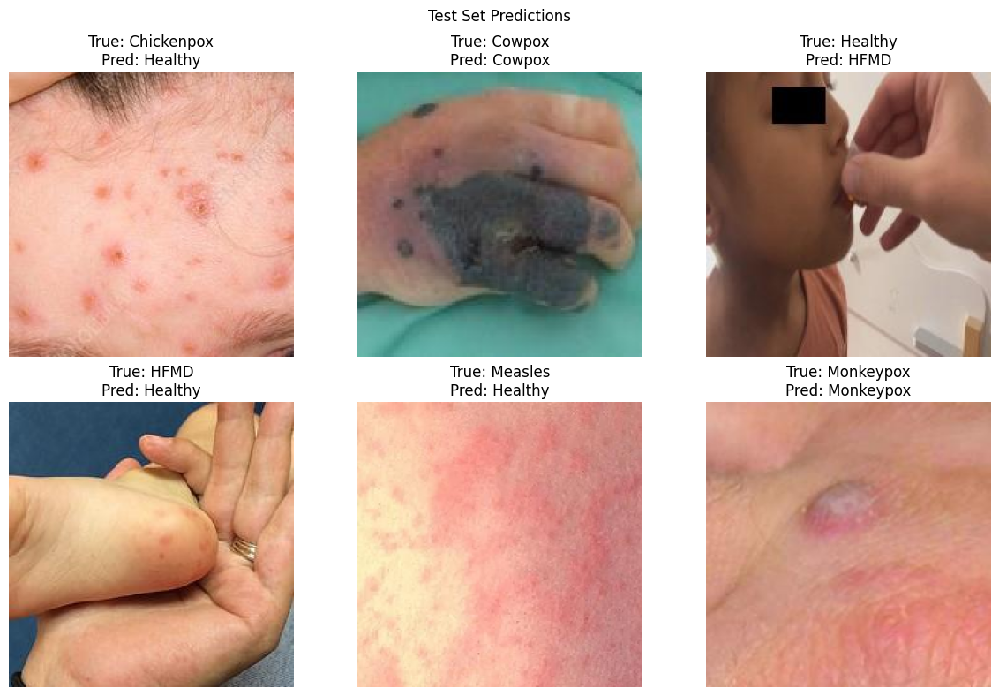

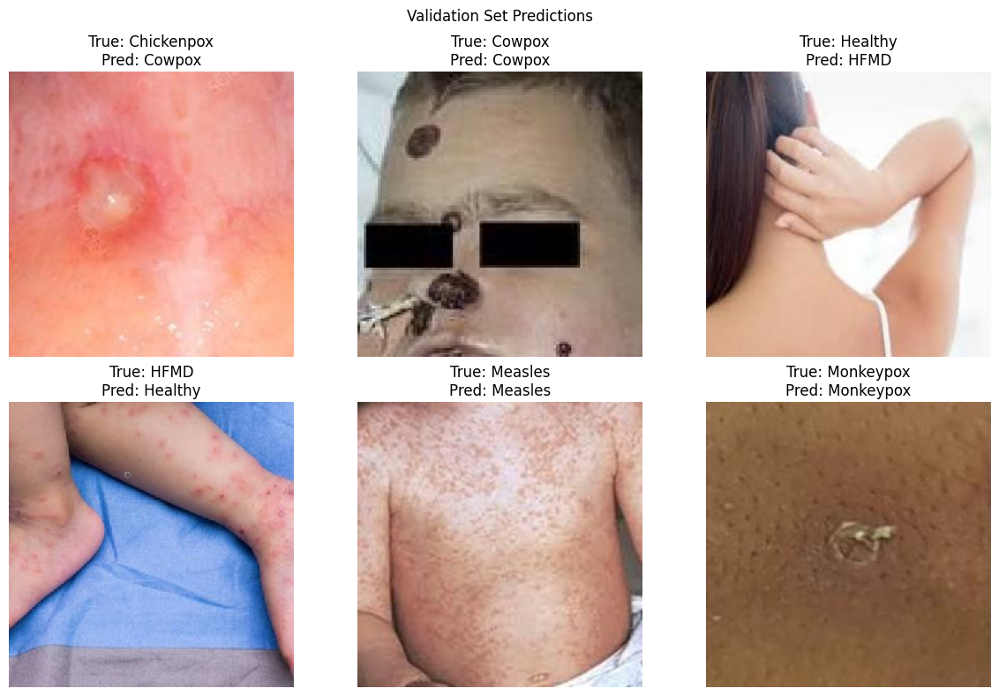

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
import numpy as np
import os
import matplotlib.pyplot as plt
import random

model_path = 'mobilenet_V2_model/models/best_model_fold_4.keras'
model = tf.keras.models.load_model(model_path)

test_dir = 'dataset/Original Images/Original Images/FOLDS/fold4/Test'
valid_dir = 'dataset/Original Images/Original Images/FOLDS/fold4/Valid'

class_names = ['Chickenpox', 'Cowpox', 'Healthy', 'HFMD', 'Measles', 'Monkeypox']

def select_one_image_per_class(directory):
    selected_images = []
    labels = []
    for class_name in class_names:
        class_path = os.path.join(directory, class_name)
        img_files = os.listdir(class_path)
        if img_files:
            img_name = random.choice(img_files)
            img_path = os.path.join(class_path, img_name)
            selected_images.append(img_path)
            labels.append(class_name)
    return selected_images, labels

def load_and_preprocess_image(img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = preprocess_input(img_array)
    return img_array

def make_predictions(image_paths):
    images = []
    for img_path in image_paths:
        img_array = load_and_preprocess_image(img_path)
        images.append(img_array)
    images = np.array(images)
    predictions = model.predict(images)
    predicted_classes = np.argmax(predictions, axis=1)
    return predicted_classes

def display_predictions(image_paths, true_labels, predicted_classes, title):
    plt.figure(figsize=(12, 8))
    for i, img_path in enumerate(image_paths):
        plt.subplot(2, 3, i+1)
        img = image.load_img(img_path, target_size=(224, 224))
        plt.imshow(img)
        plt.title(f"True: {true_labels[i]}\nPred: {class_names[predicted_classes[i]]}")
        plt.axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

test_images, test_labels = select_one_image_per_class(test_dir)
valid_images, valid_labels = select_one_image_per_class(valid_dir)

predicted_classes_test = make_predictions(test_images)
predicted_classes_valid = make_predictions(valid_images)

display_predictions(test_images, test_labels, predicted_classes_test, "Test Set Predictions")

display_predictions(valid_images, valid_labels, predicted_classes_valid, "Validation Set Predictions")

2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step


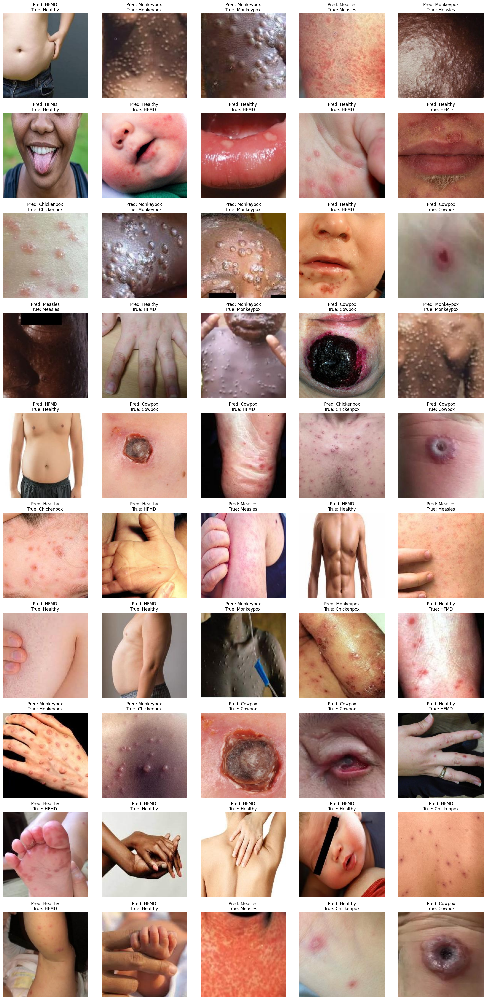

Classification Report:
              precision    recall  f1-score   support

  Chickenpox       1.00      0.29      0.44         7
      Cowpox       0.88      1.00      0.93         7
     Healthy       0.00      0.00      0.00        12
        HFMD       0.00      0.00      0.00        10
     Measles       1.00      0.83      0.91         6
   Monkeypox       0.73      1.00      0.84         8

    accuracy                           0.44        50
   macro avg       0.60      0.52      0.52        50
weighted avg       0.50      0.44      0.44        50



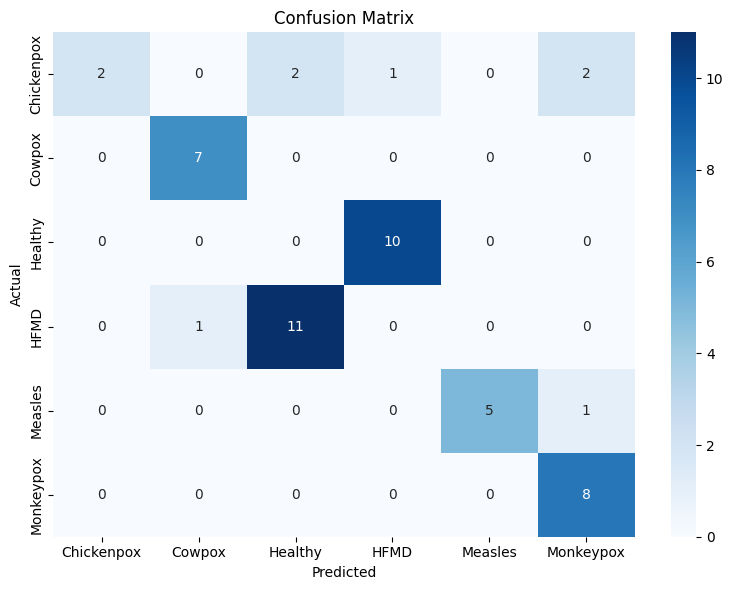

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input, MobileNetV2
from tensorflow.keras.models import load_model
import numpy as np
import os
import matplotlib.pyplot as plt
import random
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

num_classes = 6
class_names = ['Chickenpox', 'Cowpox', 'Healthy', 'HFMD', 'Measles', 'Monkeypox']
input_shape = (224, 224)

def load_trained_model(model_path):
    """
    Load the trained Keras model.
    """
    model = load_model(model_path)
    return model

def get_test_image_paths(data_root, fold, num_images=10):
    """
    Retrieve random image paths and their true labels from the test directory of a specific fold.
    """
    test_dir = os.path.join(
        data_root,
        'Original Images',
        'Original Images',
        'FOLDS',
        f'fold{fold}',
        'Test'
    )
    image_label_pairs = []
    images_per_class = max(1, num_images // num_classes)

    for class_name in class_names:
        class_path = os.path.join(test_dir, class_name)
        if os.path.exists(class_path):
            images = os.listdir(class_path)
            if len(images) == 0:
                continue
            selected_images = random.sample(images, min(len(images), images_per_class))
            for img in selected_images:
                img_path = os.path.join(class_path, img)
                image_label_pairs.append((img_path, class_name))
    
    if len(image_label_pairs) < num_images:
        additional_needed = num_images - len(image_label_pairs)
        for class_name in class_names:
            class_path = os.path.join(test_dir, class_name)
            if os.path.exists(class_path):
                images = os.listdir(class_path)
                available = [img for img in images if (os.path.join(class_path, img), class_name) not in image_label_pairs]
                if available:
                    selected = random.sample(available, min(len(available), additional_needed))
                    for img in selected:
                        img_path = os.path.join(class_path, img)
                        image_label_pairs.append((img_path, class_name))
                        additional_needed -= 1
                        if additional_needed == 0:
                            break
            if additional_needed == 0:
                break
    
    random.shuffle(image_label_pairs)
    return image_label_pairs[:num_images]

def preprocess_image(img_path):
    """
    Load and preprocess the image.
    """
    img = image.load_img(img_path, target_size=input_shape)
    img_array = image.img_to_array(img)
    img_array = preprocess_input(img_array)
    return img_array

def make_predictions(model, image_label_pairs):
    """
    Make predictions on the list of image paths.
    """
    images = np.array([preprocess_image(p[0]) for p in image_label_pairs])
    preds = model.predict(images)
    pred_classes = np.argmax(preds, axis=1)
    return pred_classes

def display_results(image_label_pairs, pred_classes):
    """
    Display images with predicted and true labels.
    """
    num_images = len(image_label_pairs)
    cols = 5
    rows = num_images // cols + int(num_images % cols != 0)
    plt.figure(figsize=(cols * 4, rows * 4))
    
    for idx, ((img_path, true_label), pred_class) in enumerate(zip(image_label_pairs, pred_classes)):
        img = image.load_img(img_path, target_size=input_shape)
        plt.subplot(rows, cols, idx + 1)
        plt.imshow(img)
        plt.title(f"Pred: {class_names[pred_class]}\nTrue: {true_label}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

    true_labels = [label for (_, label) in image_label_pairs]
    predicted_labels = [class_names[p] for p in pred_classes]

    print("Classification Report:")
    print(classification_report(true_labels, predicted_labels, target_names=class_names))

    cm = confusion_matrix(true_labels, predicted_labels, labels=class_names)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', 
                xticklabels=class_names, 
                yticklabels=class_names, cmap='Blues')
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    plt.show()

def main(data_root, fold=4, num_images=10):
    model_dir = 'mobilenet_V2_model/models'
    model_path = os.path.join(model_dir, f'best_overall_model.h5')
    
    if not os.path.exists(model_path):
        print(f"Model file not found at {model_path}. Please check the path and try again.")
        return
    
    model = load_trained_model(model_path)
    
    image_label_pairs = get_test_image_paths(data_root, fold, num_images)
    
    if len(image_label_pairs) < num_images:
        print(f"Only found {len(image_label_pairs)} images out of the requested {num_images}.")
    
    pred_classes = make_predictions(model, image_label_pairs)
    
    display_results(image_label_pairs, pred_classes)

data_root = 'dataset'
num_images = 50  

main(data_root, fold, num_images)